## Airbnb Seattle Analysis
For this project, 5 questions are to be explored:
1. What are the busiest times of the year to visit Seattle?
2. How does price change across the year? Is there any trend or seasonality?
3. How do customers feel about their stays in Seattle? Positive or negative? What are the keywords in their reviews?
4. Can we predict the price based on the host and room data?
5. What factors of homestays contribute to salary?

Q1, 2 and 3 require **descriptive statistics** and **appropriate visualization**.

Q4 and 5 require **referential statistics** and **machine learning techniques**.

In [1]:
import eda_utility as u
import predictive_utility as p
import pandas as pd
%matplotlib inline

In [2]:
# import datasets
calendar = pd.read_csv('Seattle_data/calendar.csv')
listings = pd.read_csv('Seattle_data/listings.csv')
reviews = pd.read_csv('Seattle_data/reviews.csv')

## Exploratory Data Analysis(EDA)
In this part, I focused on the first 3 questions regarding price trend, sentiment keywords, and room distribution.

#### Question 1: What are the busiest times of the year to visit Seattle?
The calendar dataset contains availability and price data of rooms from 01/01/2016 to 01/02/2017.
To find out the month with most rooms booked, I grouped count by the month and sort the grouped dataframe in a descending order.
The result indicates that based on the number of booked rooms, March and December are the busiest times.

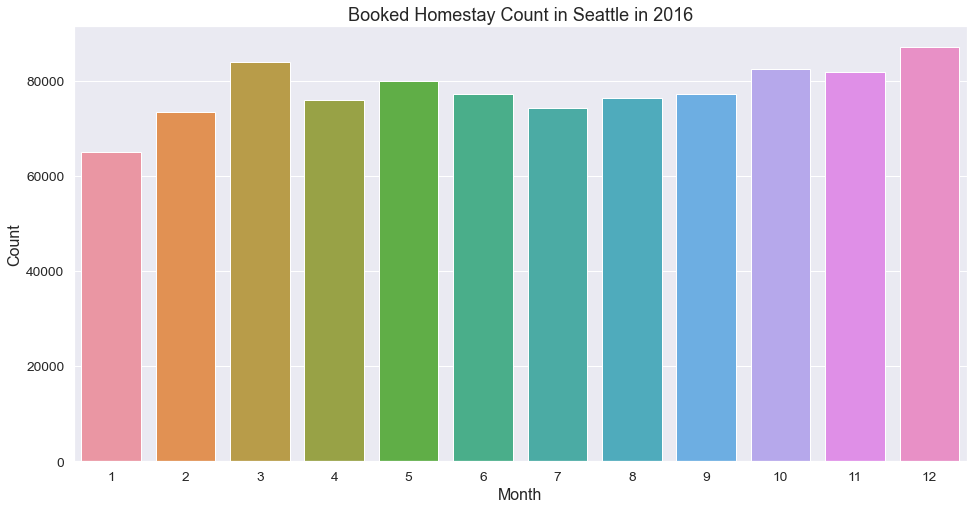

,month,count
0,12,87061
1,3,83938
2,10,82438
3,11,81780
4,5,79971
5,9,77246
6,6,77244
7,8,76347
8,4,76037
9,7,74222


In [4]:
# EDA for seattle
# busy times
month_count = u.busiest_time(calendar, 'Seattle')
month_count

#### Time Series Analysis
#### Question 2: How does price change across the year? Is there any trend or seasonality?
With the date and price data, I plotted the price by date line chart to have an overview of how price change.
The plot shows a clear bell-shaped trend and a seasonality with 4 peaks a month. With these features, the series is
appropriate for a further decomposition analysis.

Time series are composed of 3 parts, a trend component, a seasonal component, and a remainder component.
There are two methods of seasonal decomposition, addictive and multiplicative decomposition. Since magnitude of the
seasonal fluctuations does not vary with the level of the time series, I employed addictive method here. The formula is:

*y = Trend + Seasonality + Residual*

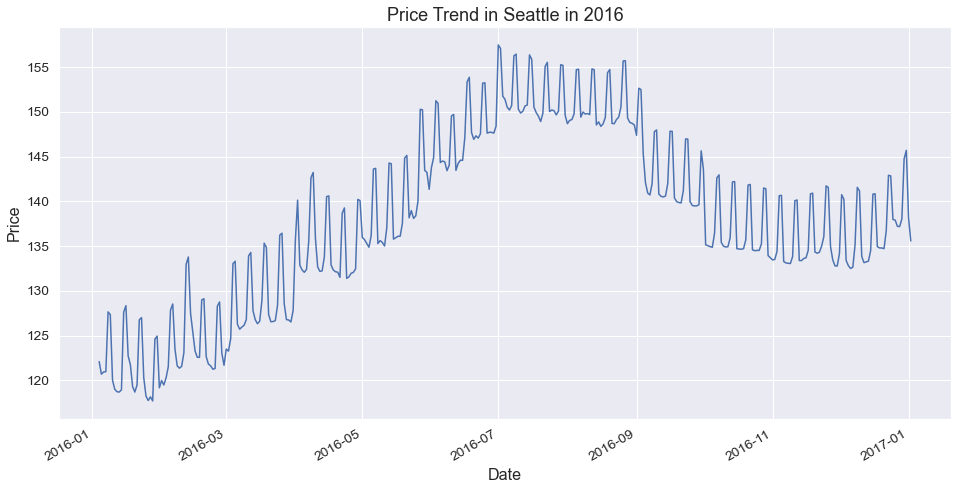

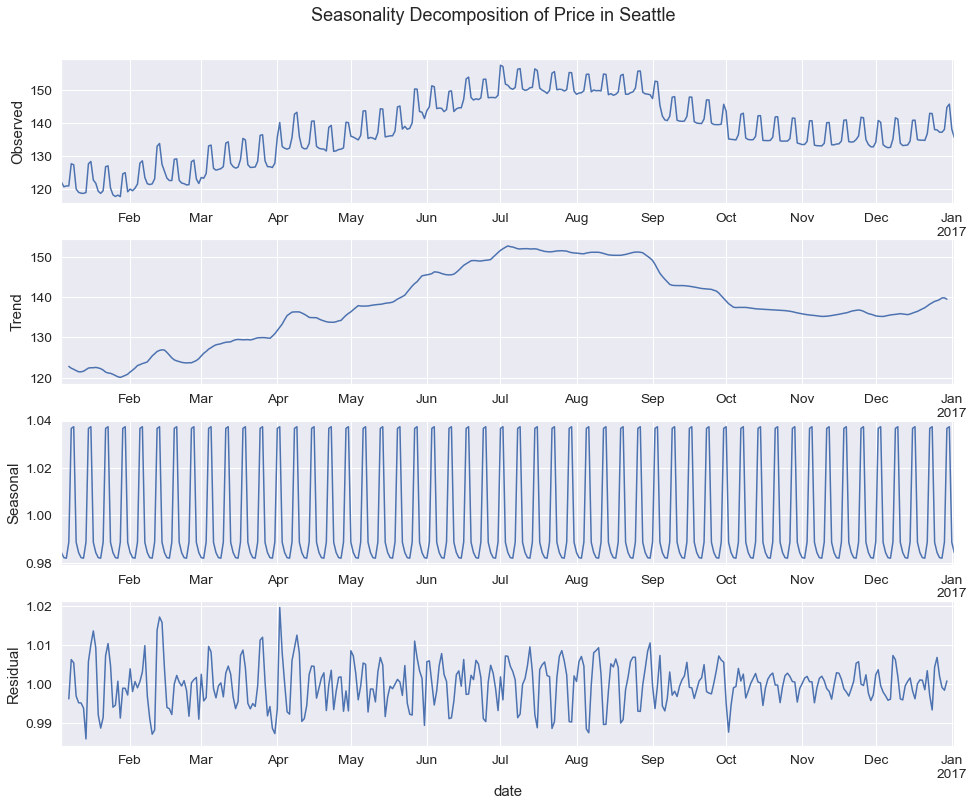

In [6]:
# Time series analysis
# price by date plot
u.time_series_analysis(calendar, 'Seattle')

The 3 components are shown separately in the figure above. We can see a clear increasing trend from January to July and
a decreasing trend starting September. Also, the seasonality might indicate a weekend effect. To verity this assumption,
the average price for each day of the week by month was plotted in the figure below. **Friday** and **Saturday** see a clear
price rise while the rest of the weekdays generally remain the same price.

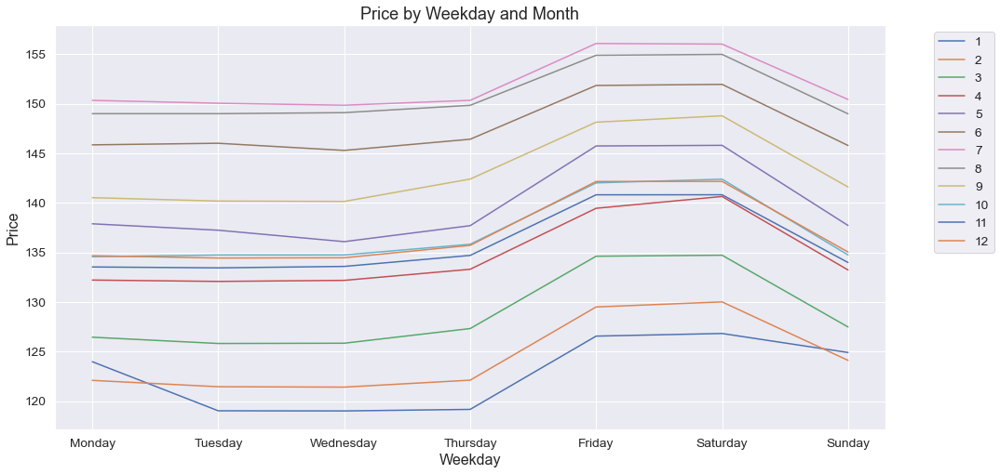

In [6]:
# decomposition into trend, seasonality, and residual
u.weekday_decomposition(calendar)


#### Sentiment Analysis
#### Question 3: How do customers feel about their stays in Seattle? Positive or negative? What are the keywords in their reviews?
Listening to the customers is the best and efficient way to detect problems and new opportunities. Since the review dataset
does not provide the sentiment label or rating scores, I employed rule-based sentiment analysis models **VADER**, which works
well on social media text. The main steps includes:
* Text Preprocessing<br>
Even though one of the benefits of VADER model is it does not require a complex text preprocessing, I found that fully
preprocessed text with stemming and lemmatization performs better.
    * Convert to lower case
    * Tokenized for processing individual words
    * Remove punctuation, numbers, or uninterested tokens
    * Remove stop words
    * Part-of-speech(POS) tagging
    * Lexicon normalization: stemming and lemmatization
* Use Vader model to calculate sentiment score<br>
Vader calculates four types of scores, negative, positive, neural, and compound. The score is measured on a scale from -4 to 4.
* Label reviews<br>
    Rules: <br>
    compound score >= .05 ==> positive<br>
    compound score <= -.05 ==> negative<br>
    -.05 <= compound score <= .05 ==> neutral/not applicable<br>

From the sentiment distribution plot below, we can find that positive sentiment dominant the reviews, account for around
96% of all.

In [3]:
# Sentiment Analysis
sentiment_df = u.sentiment_analysis(reviews)

Sentiment distribution table:
                    index  sentiment
0                positive   0.960368
1  neutral/not applicable   0.020653
2                negative   0.018979


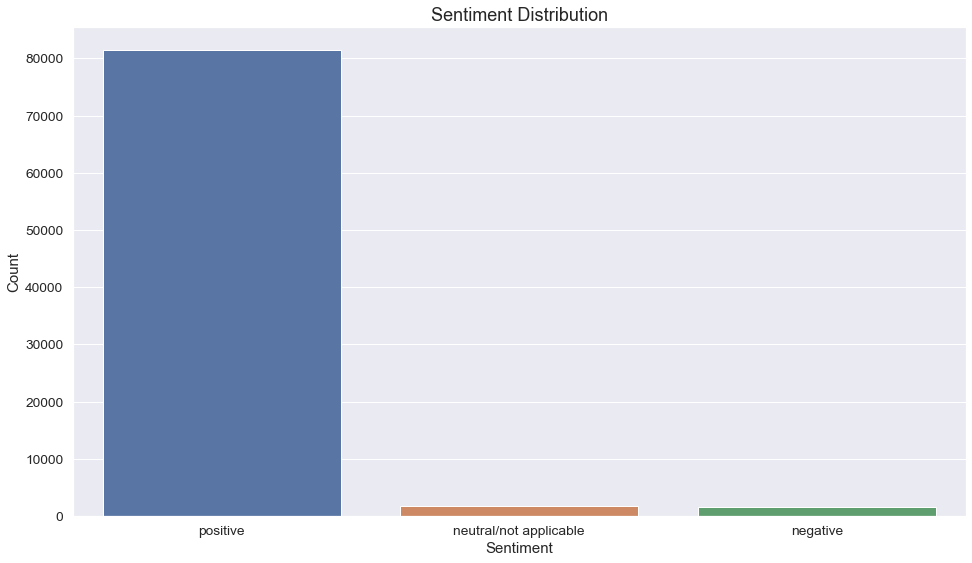

In [6]:
u.sentiment_distribution(sentiment_df)

#### Keyword Frequency
To dive deep into the keywords of customer’s experience with Airbnb in Seattle, I counted the number of each word in reviews
and found the top 30 words that most frequently appeared. Since raw texts were preprocessed for analysis, the words here
are in their root form.One thing to mention here is that since many negative reviews were written in languages other than
English, there are many incomprehensible words in that part.

The word frequency chart below indicates that keywords of pleasant customers
include “location”, “clean”, “comfort”, “host”, “neighborhood”, “easy”, “downtown”, etc.
For negative reviews, “arrive”, “reservation”, and “cancel” are among the top. It can also be captured that there’s some
overlap between both positive and negative reviews, such as “host”, “apartment”, “location”, “room” etc.

Besides exploring the keywords individually, I plotted the word clouds that take collocations into consideration.
From the word clouds below, you can easily capture the key points of customers:<br>

**Positive:** “highly recommended”, “great host”, “walk distance”, “clean”, “comfortable”, “enjoy stay”, etc.<br>
**Negative:** “auto post”, “day arrived”, “host cancel”, “cancel reservation” etc.

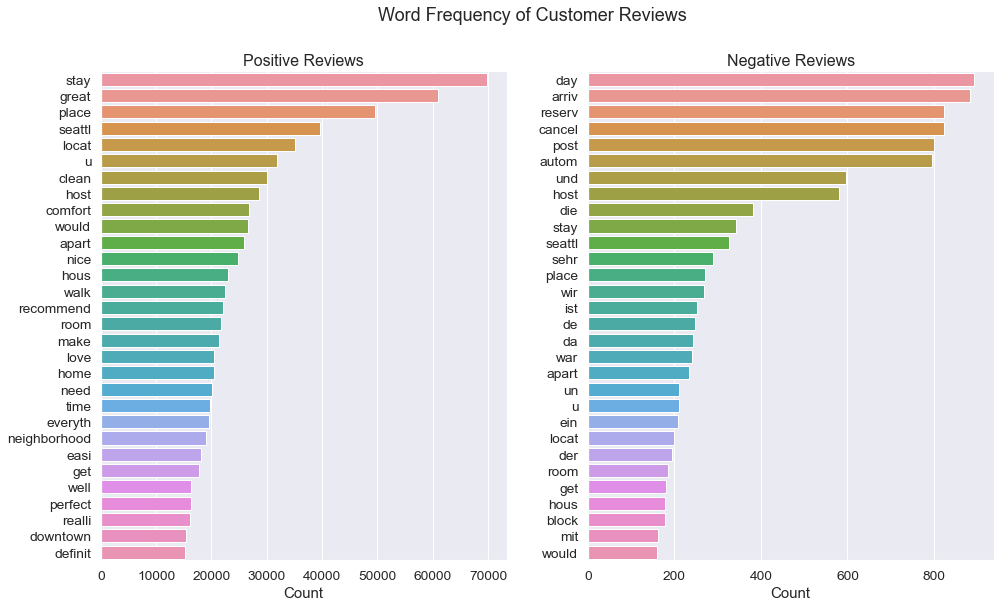

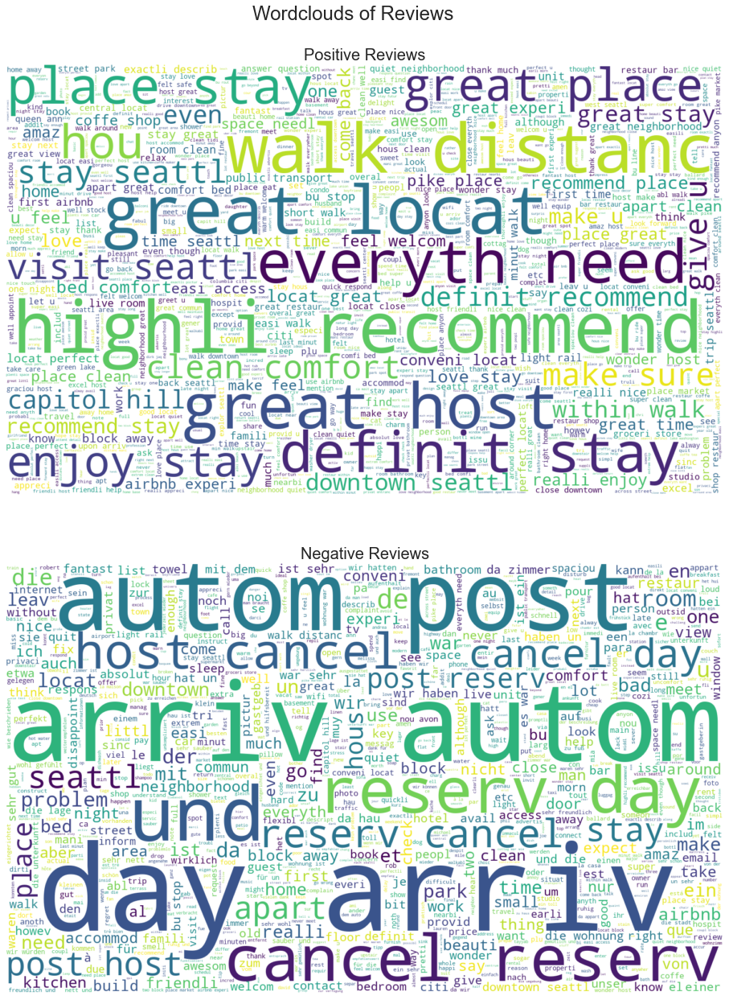

In [5]:
u.sentiment_word_plots(sentiment_df)

#### Room Distribution
Here is a brief overview of how room type distributed, how price varies among different types, and what are the most
popular neighbourhood. Feel free to explore with the information on the interactive maps below.

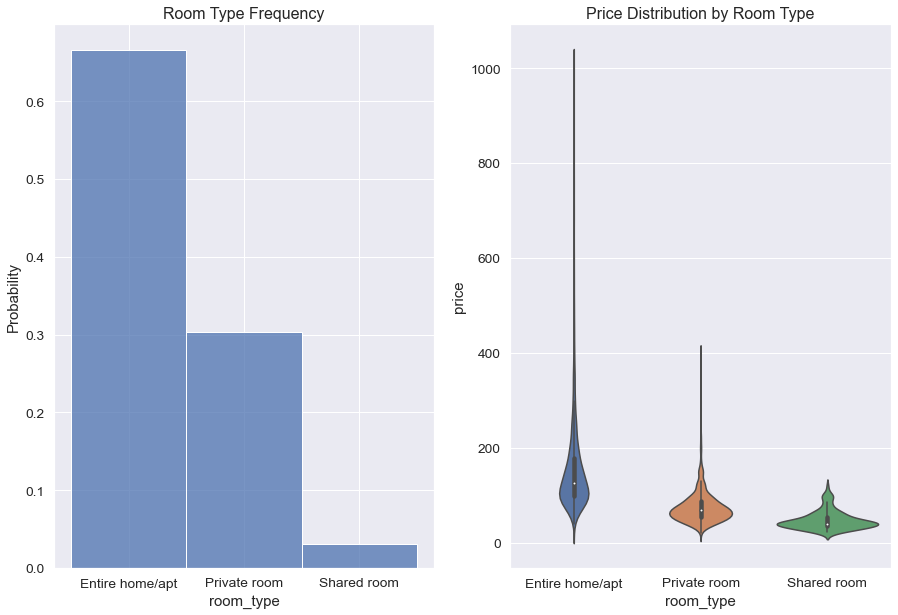


============================================Visualization on Map==============================================



In [5]:
# listing distribution visualization
# seattle location
seattle_location = [47.6062, -122.3321]

listing_map = u.listing_distribution_map(listings, seattle_location)
listing_map

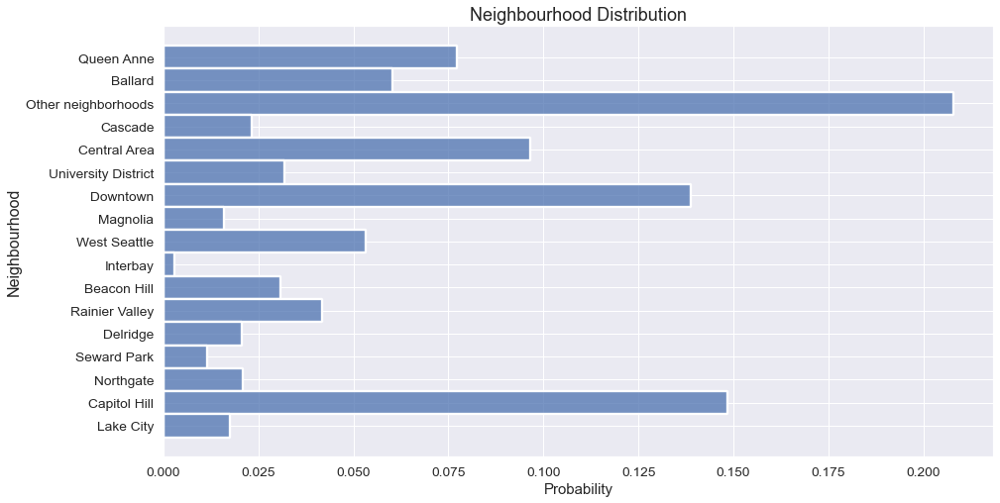


============================================Visualization on Map==============================================



In [4]:
neighbourhood_map = u.listing_count_map(listings, seattle_location)
neighbourhood_map

## Predictive Analysis
For Q4 and 5, I built a linear regression model based on the listing dataset.

#### Question 4: Can we predict the price based on the host and room data?
The answer is definitely YES. The numeric "price" variable is the response variable and some of the rest are exploratory
variables.

The original listing dataset has 92 columns, including many redundant and uninterested features. Before building the
regression model, a comprehensive **preprocessing** and **feature engineering** is critical.

**Main steps includes:**
* **Initial Clean:** Remove duplicated features/records, redundant features(id/name/location/datetime/long text), and
features with only one value.
* **Clean Numerical Features:** Convert string numerical features into numeric datatype. For example, I removed the
dollar/percent signs, cast strings into numeric, and converted percent into decimal.
* **Clean Categorical Features:** Check variability of categorical features, remove features with too many levels, and
drop strongly imbalanced features since they tell little information and remove .
* **Handle Missing Values:** Fill categorical features with the column mode and numerical features with the column mean.
For this step, I would try predicting missing value with predictive models or KNN imputation if have enough time.

The processed dataset ready for modeling has 42 features.

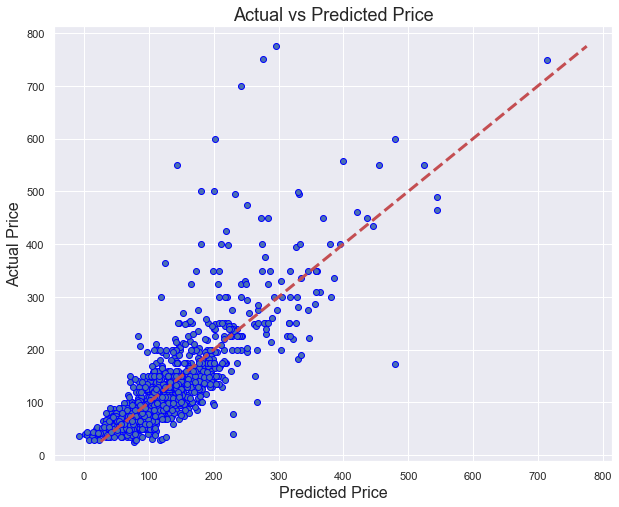

The initial model performance for testing set
--------------------------------------
MAE is 33.04880812289627
MSE is 3035.170499675571
R2 score is 0.6458371086072899


In [14]:
# Predictive modeling for Airbnb 'price' feature
# Clean dataset
df = p.clean_listings(listings)

### Fit and Evaluate the initial regression model

For the initial model, I plugged in all the features to first gain an overview on how the model work on the dataset.
The performance metric shows that 64.58% of the variance for price can be explained by my model(R-square=0.6458).
The small mean absolute error(33) and large mean squared error(3035) tell that there are some outliers that produce hugh
difference and drive the MSE to very high. From the actual by predicted value plot, we can fidn that the regression model
perform much better for price less than 200 as compared to more expensive ones.

In [ ]:
# Modeling
# Initial model
X, y= p.initial_model(df, test_size=.30, rand_state=42)

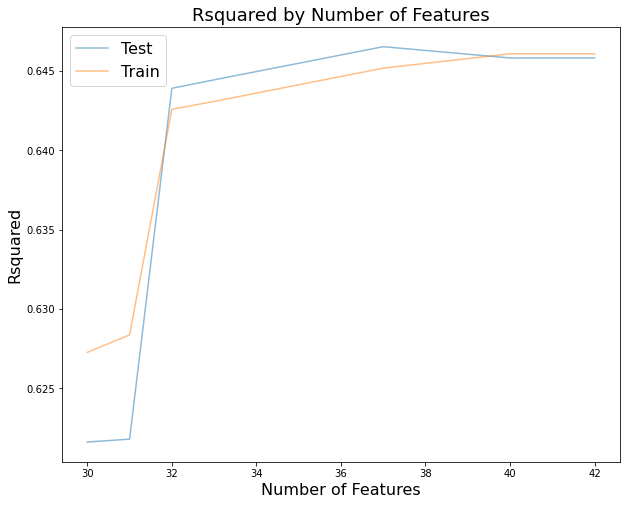

The model performance for optimal linear regression model
------------------------------------------------------------
Number of Features: 37
R2 score for test set: 0.6465455453531974
R2 score for training set: 0.6451917400822842


In [9]:
# Find the optimal model by changing training features
cutoffs = [3500, 3000, 2500, 2000, 1000, 500, 100, 50, 30, 25]
best_r2_test, best_r2_train, lm_model, X_train, X_test, y_train, y_test = p.find_optimal_lm_model(X, y, cutoffs)

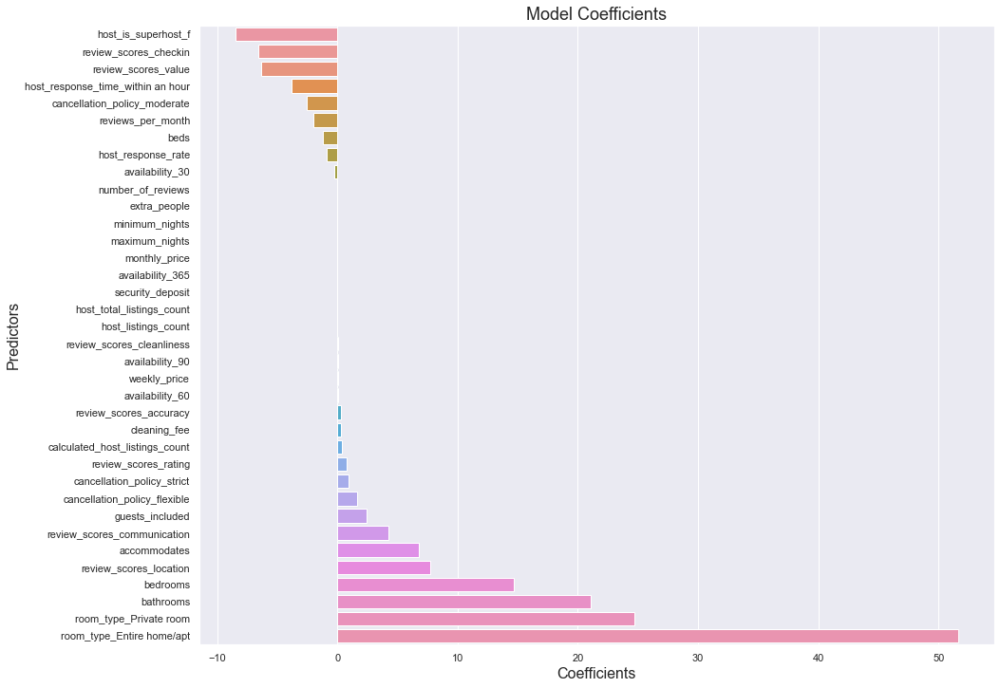

,predictors,coefs,abs_coefs
24,host_acceptance_rate,-71462.176099,71462.176099
32,room_type_Entire home/apt,51.613111,51.613111
33,room_type_Private room,24.730468,24.730468
3,bathrooms,21.098293,21.098293
4,bedrooms,14.679835,14.679835
31,host_is_superhost_f,-8.498724,8.498724
19,review_scores_location,7.694059,7.694059
2,accommodates,6.784409,6.784409
17,review_scores_checkin,-6.598437,6.598437
20,review_scores_value,-6.315328,6.315328


In [11]:
# feature importance
coef_df = p.coef_weights(lm_model, X_train)
coef_df.head(10)

